## Research

Dataset from kagle link : 
- https://www.kaggle.com/datasets/kaushiksuresh147/solana-cryptocurrency-historical-dataset

<br>Machine learning for crypto:
- https://www.sciencedirect.com/science/article/pii/S2405918822000174

<br>which model to use :
- https://neptune.ai/blog/arima-vs-prophet-vs-lstm#:~:text=Prophet's%20advantage%20is%20that%20it,are%20only%20a%20special%20case.

- https://watermark.silverchair.com/hhaa009.pdf?token=AQECAHi208BE49Ooan9kkhW_Ercy7Dm3ZL_9Cf3qfKAc485ysgAAAsIwggK-BgkqhkiG9w0BBwagggKvMIICqwIBADCCAqQGCSqGSIb3DQEHATAeBglghkgBZQMEAS4wEQQM6XC8NIwm_V5m_ayoAgEQgIICdZIgytvxFpfrSi3ZLblJf6-m4-A6dzmy7x3ds2YDU2-MzNMwxOdaYGeHzzOPsL4YQgqWjG695wpsEu1TDRzA6xnlZzatyJ4E6iyW2Xc-tGeSbq3n7FwnhvEBRfpm6EvA-LSRJf8o7k2MEbk0Etnq9iXd1_Wgf2zLZufI1QYGvBVsJLtNDhVhbmgvlBY1mLFxAtn0_PiMiiqrG4knCyNlbAcJtd5FqzlQjCDLtwLFYYORWwNWWABkGYtE-QpFSprrXfROp2F2vVCjoSeBMdWKHwt4ZXYm7X_rxtvdesAgka4kcOhT3JpvwQ4L-ES6WLMFAGmfzxZjR9vIp4sH1DXKfshc0vcg12zMW1q165T-7xts2iE7cj3kMx39STIZqYMvILhjOyygg48rZ70EOuYMWhP9EXCHT0C4fa06-PXWeAX8RRsLK1gemfEz4SVc8FF2P9c0GwuvCr9zBMMRNUXzTHqxsGsZGLixQtHjkkaGOGTnFh9vxIIj-oS6N92PF3lZZbU6tfvJbREGa-ho8Rt9cqoD9GJGdNU399Jgz1dIK17lsH9AOV892viDhguFp6uMvAp2xsMtecv8Y-ELrbdI6pG4Tmb1yuvHOvY2LqfRvjFlkOXS145N7gCJEhDT7trjw3jWVucDdResNJFAt7NMq6RjN3gBu7Sg1TMtlbk3Jp9olt3jIX5AVptvUMZ7frtb8WRIF571gp_xqwKoyjgthrmMmP2Rc6PeS1nJfsegdgGcwra8NErgTEW9g7zG5S9ok-c4sBhsp5d7GfUcq8ef-aCZKEe0Rx9CYJRJWDvyKj8Vv7QeGfIh1wqrHzXq8aUWDtfSwqm4

https://www.researchgate.net/publication/357042521_An_On-Chain_Analysis-Based_Approach_to_Predict_Ethereum_Prices

## Import Libraries

In [97]:
import pyforest
import yfinance as yf
from datetime import datetime

import plotly.graph_objects as go
from pandas.plotting import lag_plot
from plotly_calplot import calplot
from pandas.plotting import autocorrelation_plot

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

#Model 1
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools

#Model 2
from fbprophet import Prophet

#Model 3
import torch
import torch.nn as nn
from torch.autograd import Variable

## Data Import

In [5]:
#Create a current time variable for saving files
currentDate = datetime.now().strftime("%m-%d-%y")
currentDate

'03-11-23'

In [6]:
#to get all the data that is required for this project
datasets=yf.download(tickers="SOL-USD ETH-USD",
                    period="max",
                     interval="1d",
                    ignore_tz=True,
                    prepost=False,)

#To put the data
datasets=datasets.reset_index()

#Save the file in the dataset to prevent changes in the dataset
datasets.to_csv(f'../00-Datasets/yahoo_dataset_{currentDate}.csv')

[*********************100%***********************]  2 of 2 completed


In [7]:
#Save the file in the dataset first
#datasets=pd.read_csv("../00-Datasets/yahoo_dataset_03-08-23.csv",header=[0, 1])
#Display dataset to see the data
display(datasets)

Date    Adj Close                   Close                    High  \
                     ETH-USD    SOL-USD      ETH-USD    SOL-USD      ETH-USD   
0    2017-11-09   320.884003        NaN   320.884003        NaN   329.451996   
1    2017-11-10   299.252991        NaN   299.252991        NaN   324.717987   
2    2017-11-11   314.681000        NaN   314.681000        NaN   319.453003   
3    2017-11-12   307.907990        NaN   307.907990        NaN   319.153015   
4    2017-11-13   316.716003        NaN   316.716003        NaN   328.415009   
...         ...          ...        ...          ...        ...          ...   
1944 2023-03-07  1561.933105  20.244732  1561.933105  20.244732  1579.162231   
1945 2023-03-08  1534.088257  18.421194  1534.088257  18.421194  1568.175293   
1946 2023-03-09  1438.660767  17.308147  1438.660767  17.308147  1544.108398   
1947 2023-03-10  1429.158081  18.243643  1429.158081  18.243643  1438.760132   
1948 2023-03-11  1441.588135  17.467947  1441.588135  17.467947  1481.184814   

                         Low                    Open                  Volume  \
        SOL-USD      ETH-USD    SOL-USD      ETH-USD    SOL-USD      ETH-USD   
0           NaN   307.056000        NaN   308.644989        NaN    893249984   
1           NaN   294.541992        NaN   320.670990        NaN    885985984   
2           NaN   298.191986        NaN   298.585999        NaN    842300992   
3           NaN   298.513000        NaN   314.690002        NaN   1613479936   
4           NaN   307.024994        NaN   307.024994        NaN   1041889984   
...         ...          ...        ...          ...        ...          ...   
1944  20.886848  1543.127563  19.820597  1567.424683  20.634691   6854058349   
1945  20.332367  1534.088257  18.286304  1561.977905  20.243931   7130327525   
1946  18.689047  1423.264771  16.943132  1534.031616  18.424707   9457897583   
1947  18.323397  1378.525391  16.117346  1438.760132  17.312250  12665194936   
1948  18.833788  1429.363525  17.185350  1429.869873  18.215649  14793444352   

                   
          SOL-USD  
0             NaN  
1             NaN  
2             NaN  
3             NaN  
4             NaN  
...           ...  
1944  394901279.0  
1945  620543521.0  
1946  754162560.0  
1947  944032048.0  
1948  765027136.0  

[1949 rows x 13 columns]

## Data Cleaning & EDA

In [ ]:
datasets.columns.names(Unnamed: 0_level_0,)

In [8]:
datasets.isnull().sum()

Date                    0
Adj Close  ETH-USD      0
           SOL-USD    883
Close      ETH-USD      0
           SOL-USD    883
High       ETH-USD      0
           SOL-USD    883
Low        ETH-USD      0
           SOL-USD    883
Open       ETH-USD      0
           SOL-USD    883
Volume     ETH-USD      0
           SOL-USD    883
dtype: int64

The reason for missing datas for sol is because sol was created later than eth. Therefore, the missing datas means that sol did not exist at that time.

In [9]:
display(f'The number of duplicates in this datasets are : {datasets.duplicated().sum()} .')

'The number of duplicates in this datasets are : 0 .'

In [10]:
datasets.Date

0      2017-11-09
1      2017-11-10
2      2017-11-11
3      2017-11-12
4      2017-11-13
          ...    
1944   2023-03-07
1945   2023-03-08
1946   2023-03-09
1947   2023-03-10
1948   2023-03-11
Name: Date, Length: 1949, dtype: datetime64[ns]

This is done to check the format of the index.

### Create a separate dataframe for eth and sol for analysis

In [11]:
df_datasets=datasets.set_index("Date").stack().reset_index().rename(columns={'level_1':'Ticker'})

In [12]:
df_eth=df_datasets[df_datasets["Ticker"]=="ETH-USD"]
df_eth

,Date,Ticker,Adj Close,Close,High,Low,Open,Volume
0,2017-11-09,ETH-USD,320.884003,320.884003,329.451996,307.056000,308.644989,8.932500e+08
1,2017-11-10,ETH-USD,299.252991,299.252991,324.717987,294.541992,320.670990,8.859860e+08
2,2017-11-11,ETH-USD,314.681000,314.681000,319.453003,298.191986,298.585999,8.423010e+08
3,2017-11-12,ETH-USD,307.907990,307.907990,319.153015,298.513000,314.690002,1.613480e+09
4,2017-11-13,ETH-USD,316.716003,316.716003,328.415009,307.024994,307.024994,1.041890e+09
...,...,...,...,...,...,...,...,...
3005,2023-03-07,ETH-USD,1561.933105,1561.933105,1579.162231,1543.127563,1567.424683,6.854058e+09
3007,2023-03-08,ETH-USD,1534.088257,1534.088257,1568.175293,1534.088257,1561.977905,7.130328e+09
3009,2023-03-09,ETH-USD,1438.660767,1438.660767,1544.108398,1423.264771,1534.031616,9.457898e+09
3011,2023-03-10,ETH-USD,1429.158081,1429.158081,1438.760132,1378.525391,1438.760132,1.266519e+10


In [177]:
df_sol=df_datasets[df_datasets["Ticker"]=="SOL-USD"]
df_sol

,Date,Ticker,Adj Close,Close,High,Low,Open,Volume
884,2020-04-10,SOL-USD,0.951054,0.951054,1.313487,0.694187,0.832005,87364276.0
886,2020-04-11,SOL-USD,0.776819,0.776819,1.049073,0.765020,0.951054,43862444.0
888,2020-04-12,SOL-USD,0.882507,0.882507,0.956670,0.762426,0.785448,38736897.0
890,2020-04-13,SOL-USD,0.777832,0.777832,0.891603,0.773976,0.890760,18211285.0
892,2020-04-14,SOL-USD,0.661925,0.661925,0.796472,0.628169,0.777832,16747614.0
...,...,...,...,...,...,...,...,...
3006,2023-03-07,SOL-USD,20.244732,20.244732,20.886848,19.820597,20.634691,394901279.0
3008,2023-03-08,SOL-USD,18.421194,18.421194,20.332367,18.286304,20.243931,620543521.0
3010,2023-03-09,SOL-USD,17.308147,17.308147,18.689047,16.943132,18.424707,754162560.0
3012,2023-03-10,SOL-USD,18.243643,18.243643,18.323397,16.117346,17.312250,944032048.0


In [14]:
df_eth.info()
df_sol.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1949 entries, 0 to 3013
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1949 non-null   datetime64[ns]
 1   Ticker     1949 non-null   object        
 2   Adj Close  1949 non-null   float64       
 3   Close      1949 non-null   float64       
 4   High       1949 non-null   float64       
 5   Low        1949 non-null   float64       
 6   Open       1949 non-null   float64       
 7   Volume     1949 non-null   float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 137.0+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1066 entries, 884 to 3014
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1066 non-null   datetime64[ns]
 1   Ticker     1066 non-null   object        
 2   Adj Close  1066 non-null   float64       
 3   Clo

In [15]:
display(df_eth.describe())
display(df_sol.describe())

,Adj Close,Close,High,Low,Open,Volume
count,1949.000000,1949.000000,1949.000000,1949.000000,1949.000000,1.949000e+03
mean,1144.707065,1144.707065,1180.406573,1103.569860,1144.357997,1.271298e+10
std,1169.190817,1169.190817,1205.283041,1128.764349,1169.791965,1.064862e+10
min,84.308296,84.308296,85.342743,82.829887,84.279694,6.217330e+08
25%,215.325378,215.325378,220.367004,208.830734,215.352066,4.578438e+09
50%,569.354187,569.354187,589.606995,549.096008,568.609863,1.030311e+10
75%,1703.025024,1703.025024,1756.510986,1665.090454,1703.036133,1.793320e+10
max,4812.087402,4812.087402,4891.704590,4718.039062,4810.071289,8.448291e+10


,Adj Close,Close,High,Low,Open,Volume
count,1066.000000,1066.000000,1066.000000,1066.000000,1066.000000,1.066000e+03
mean,49.076045,49.076045,51.413696,46.706504,49.085657,1.097320e+09
std,59.394774,59.394774,61.984897,56.655618,59.461147,1.449198e+09
min,0.515273,0.515273,0.559759,0.505194,0.513391,6.520200e+05
25%,3.445559,3.445559,3.733745,3.185058,3.423044,3.695134e+07
50%,30.028152,30.028152,31.773432,28.071217,30.106304,6.132407e+08
75%,63.060356,63.060356,71.732742,57.612327,63.055817,1.647161e+09
max,258.934326,258.934326,260.062103,246.122421,258.781555,1.706864e+10


In [16]:
display(df_eth.isnull().sum())
display(df_sol.isnull().sum())

Date         0
Ticker       0
Adj Close    0
Close        0
High         0
Low          0
Open         0
Volume       0
dtype: int64

Date         0
Ticker       0
Adj Close    0
Close        0
High         0
Low          0
Open         0
Volume       0
dtype: int64

### ETH analysis

<IPython.core.display.Javascript object>

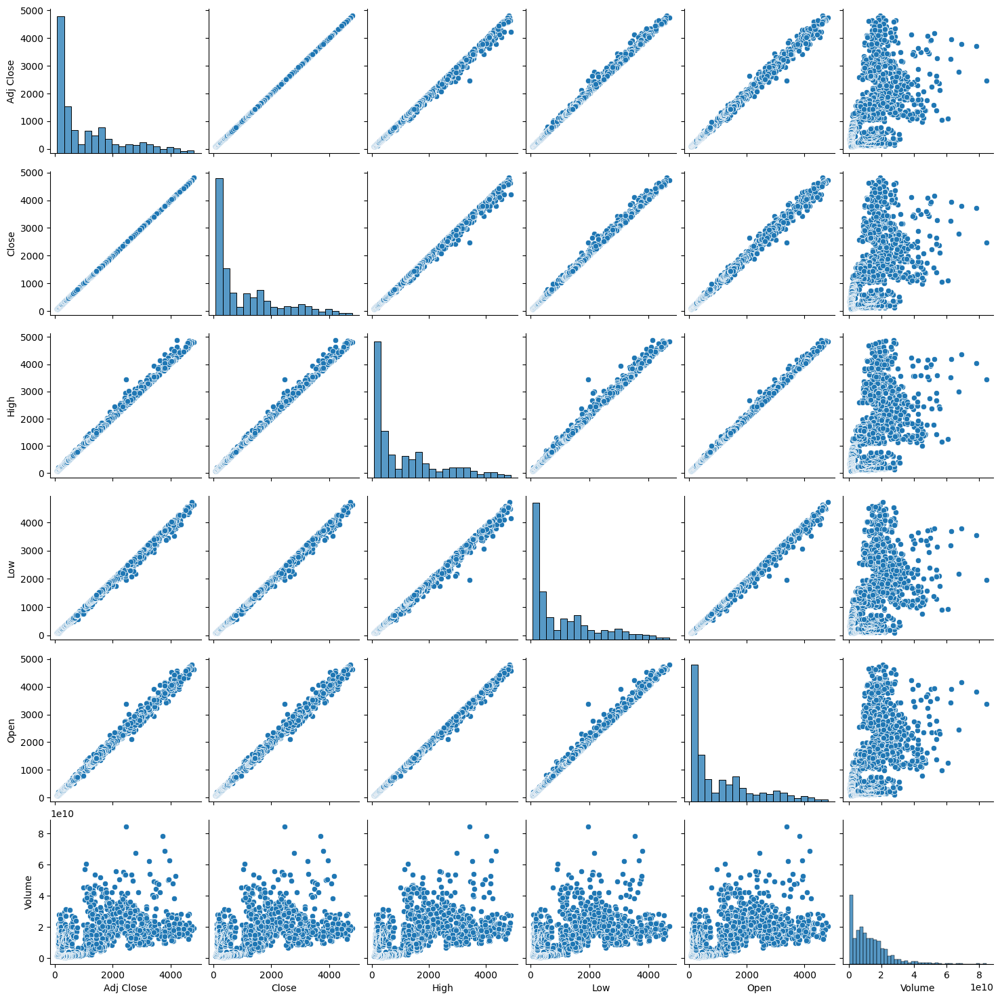

In [17]:
sns.pairplot(df_eth)

Based on the distribution plot in the centre, the data is right-skewed distribution.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/var/folders/b2/1_py_fv17p173bxx_hhg8qdc0000gn/T/ipykernel_52280/3907416421.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  eth_mask=np.triu(np.ones_like(df_eth.corr()))


<IPython.core.display.Javascript object>

/var/folders/b2/1_py_fv17p173bxx_hhg8qdc0000gn/T/ipykernel_52280/3907416421.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_eth_heatmap=sns.heatmap(df_eth.corr(),


<IPython.core.display.Javascript object>

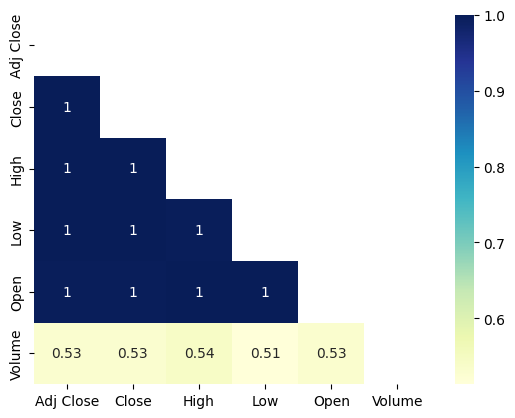

In [18]:
#Triangle Eth correlation Heatmap

#Create mask
eth_mask=np.triu(np.ones_like(df_eth.corr()))

#Plot triangle correlation heatmap
df_eth_heatmap=sns.heatmap(df_eth.corr(),
                       cmap="YlGnBu",
                      annot=True,
                      mask=eth_mask)

# displaying heatmap
plt.show()

In [19]:
#Basic trading visualisation

#Solana visualisation
fig_eth = go.Figure(data=[go.Candlestick(x=df_eth["Date"], 
                                     open=df_eth['Open'], 
                                     high=df_eth['High'], 
                                     low=df_eth['Low'], 
                                     close=df_eth['Close'])])

#Label of visualisation
fig_eth.update_layout(
    title='Eth Cryptocurrency',
    yaxis_title='Eth price (USD)')

#Show figure
fig_eth.show()

In [20]:
#Plot line plot
lineplot_fig_eth=px.line(df_eth,
                     x=df_eth.Date,
                     y="Close",
                     title="Eth price (USD) in line plot"
                     ,log_x=False,log_y=False)

#Label of visualisation
lineplot_fig_eth.update_layout(yaxis_title='Eth closing price (USD)')

#Show figure
lineplot_fig_eth.show()

<IPython.core.display.Javascript object>

In [21]:
'''
look at time lag betwen consecutive entries

we start with 1 instead of 0 since there's nothing to compare the first entry to
'''
(df_eth.index[1:]-df_eth.index[:-1]).value_counts().head()

2    1065
1     883
dtype: int64

In [22]:
#Show distribution and outlier

dis_fig_eth = px.histogram(df_eth, x=df_eth.Date, y="Close",
                       marginal="box", # or violin, rug
                       hover_data=df_eth.columns,
                       title="Histogram & Boxplot of closing prices for Eth")

#Label of visualisation
dis_fig_eth.update_layout(yaxis_title='Frequency',xaxis_title='Days from the start of Eth to present')

dis_fig_eth.show()

<IPython.core.display.Javascript object>

In [23]:
df_eth.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1949 entries, 0 to 3013
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1949 non-null   datetime64[ns]
 1   Ticker     1949 non-null   object        
 2   Adj Close  1949 non-null   float64       
 3   Close      1949 non-null   float64       
 4   High       1949 non-null   float64       
 5   Low        1949 non-null   float64       
 6   Open       1949 non-null   float64       
 7   Volume     1949 non-null   float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 137.0+ KB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

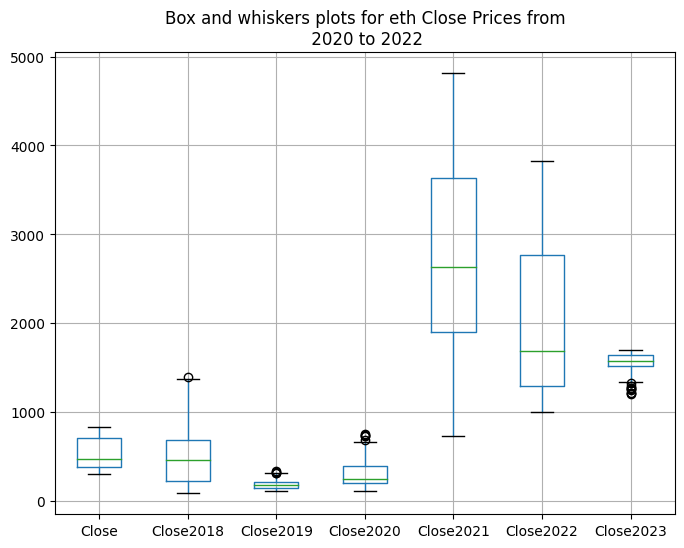

In [24]:
#Boxplot by year

groups = df_eth.set_index("Date").groupby(pd.Grouper(freq='A')) # group by year

years = pd.DataFrame([])

for name, group in groups: # iterate through the years
    tmp = group.groupby(pd.Grouper(freq='D')).Close.mean() # compute the daily mean
    tmp.index = tmp.index.strftime('%m-%d') # transform the index into 'mm-dd' only
    
    years = years.join(tmp, rsuffix=name.year, how = "outer") # join together yearly series (on the 'mm-dd' index) 
    
years.boxplot(figsize=(8,6))

plt.title('Box and whiskers plots for eth Close Prices from\n 2020 to 2022');

In [39]:
#https://python.plainenglish.io/interactive-calendar-heatmaps-with-plotly-the-easieast-way-youll-find-5fc322125db7
#https://www.analyticsvidhya.com/blog/2021/02/visualization-in-time-series-using-heatmaps-in-python/

time_heatmap_eth=calplot(df_eth,x="Date",y="Close",
                     title="Yearly Calander Heatmap for ETH Prices",
                     month_lines_width=5,gap=0.9,
                     years_title=True,
                     space_between_plots=0.08,
                     showscale=True)

time_heatmap_eth.show()

#### Solana Analysis

<IPython.core.display.Javascript object>

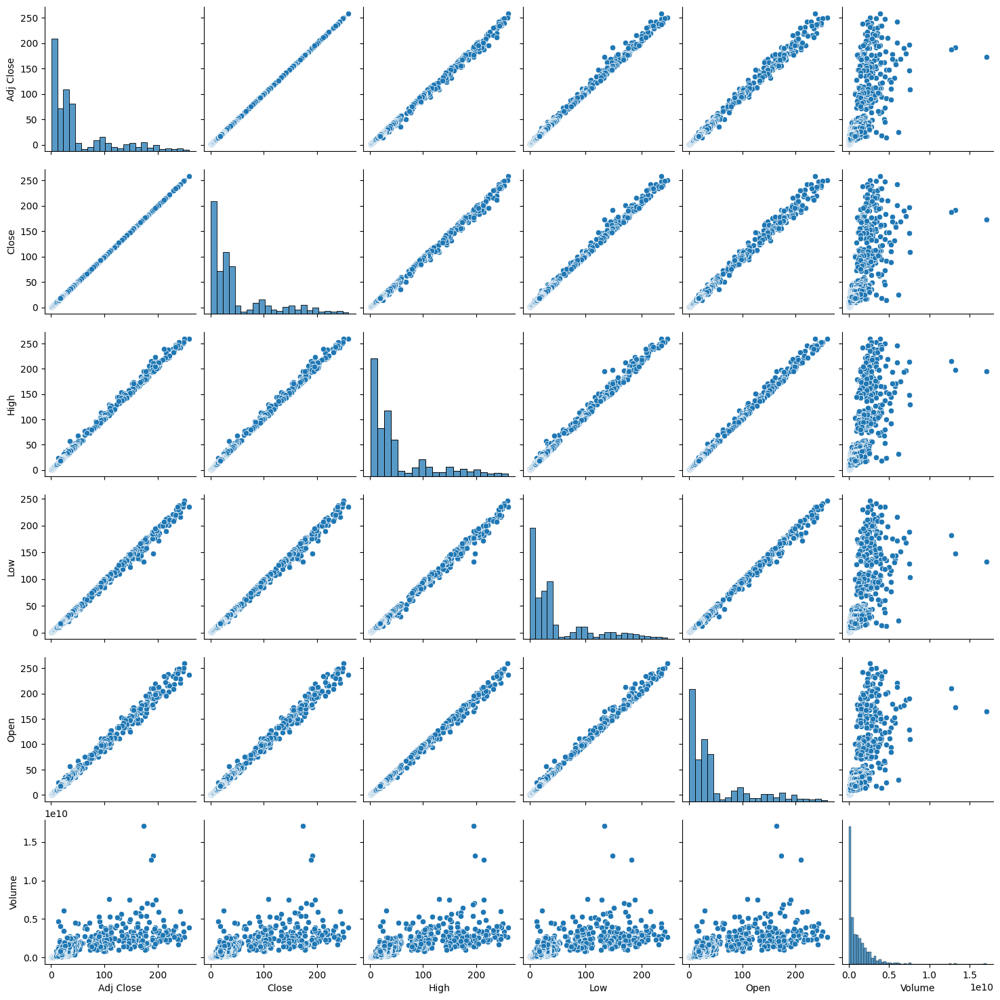

In [40]:
sns.pairplot(df_sol)

In [41]:
#Basic trading visualisation

#Solana visualisation
fig_sol = go.Figure(data=[go.Candlestick(x=df_sol.Date, 
                                     open=df_sol['Open'], 
                                     high=df_sol['High'], 
                                     low=df_sol['Low'], 
                                     close=df_sol['Close'])])

#Label of visualisation
fig_sol.update_layout(
    title='Solana Cryptocurrency',
    yaxis_title='Solana price (USD)')

#Show figure
fig_sol.show()

The top visualisation is done to get a feel of the solana price chart before further analysis are made.

In [42]:
'''
look at time lag betwen consecutive entries

we start with 1 instead of 0 since there's nothing to compare the first entry to
'''
(df_sol.index[1:]-df_sol.index[:-1]).value_counts().head()

2    1065
dtype: int64

This means that there is no gaps in our dataset.

In [43]:
#Plot line plot
lineplot_fig_sol=px.line(df_sol,
                     x=df_sol.Date,
                     y="Close",
                     title="Evolution of Solana price (USD) in line plot"
                     ,log_x=False,log_y=False)

#Label of visualisation
lineplot_fig_sol.update_layout(yaxis_title='Solana closing price (USD)')

#Show figure
lineplot_fig_sol.show()

<IPython.core.display.Javascript object>

In [44]:
#Show distribution and outlier

dis_fig_sol = px.histogram(df_sol, x=df_sol.Date, y="Close",
                       marginal="box", # or violin, rug
                       hover_data=df_sol.columns,
                       title="Histogram & Boxplot of closing prices for Solana")

#Label of visualisation
dis_fig_sol.update_layout(yaxis_title='Frequency',xaxis_title='Days from the start of Solana to present')

dis_fig_sol.show()

<IPython.core.display.Javascript object>

The distribution seems slightly right skewed. Let do the boxplot by year.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

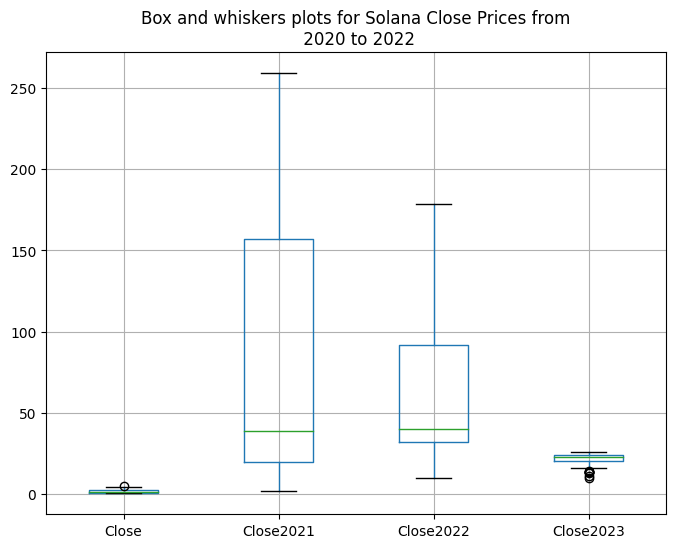

In [45]:
#Boxplot by year

groups = df_sol.set_index("Date").groupby(pd.Grouper(freq='A')) # group by year

years = pd.DataFrame([])

for name, group in groups: # iterate through the years
    tmp = group.groupby(pd.Grouper(freq='D')).Close.mean() # compute the daily mean
    tmp.index = tmp.index.strftime('%m-%d') # transform the index into 'mm-dd' only
    
    years = years.join(tmp, rsuffix=name.year, how = "outer") # join together yearly series (on the 'mm-dd' index) 
    
years.boxplot(figsize=(8,6))

plt.title('Box and whiskers plots for Solana Close Prices from\n 2020 to 2022');


In [46]:
#https://python.plainenglish.io/interactive-calendar-heatmaps-with-plotly-the-easieast-way-youll-find-5fc322125db7
#https://www.analyticsvidhya.com/blog/2021/02/visualization-in-time-series-using-heatmaps-in-python/

time_heatmap=calplot(df_sol,x="Date",y="Close",
                     title="Yearly Calander Heatmap for Solana Prices",
                     month_lines_width=5,gap=0.9,
                     years_title=True,
                     space_between_plots=0.08,
                     showscale=True)

time_heatmap.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

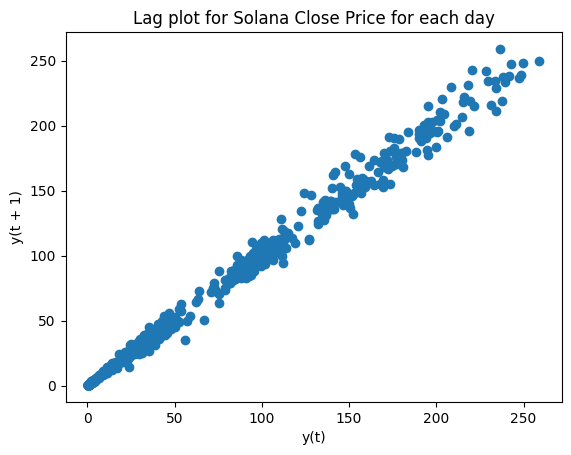

In [47]:
#Create a lag_plot
lag_plot(df_sol.set_index("Date").groupby(pd.Grouper(freq='D')).Close.mean())
plt.title("Lag plot for Solana Close Price for each day")
plt.show()

We see a strong positive relation between Close price at t and Close price at t+1.

Let's experiment with the lag value.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

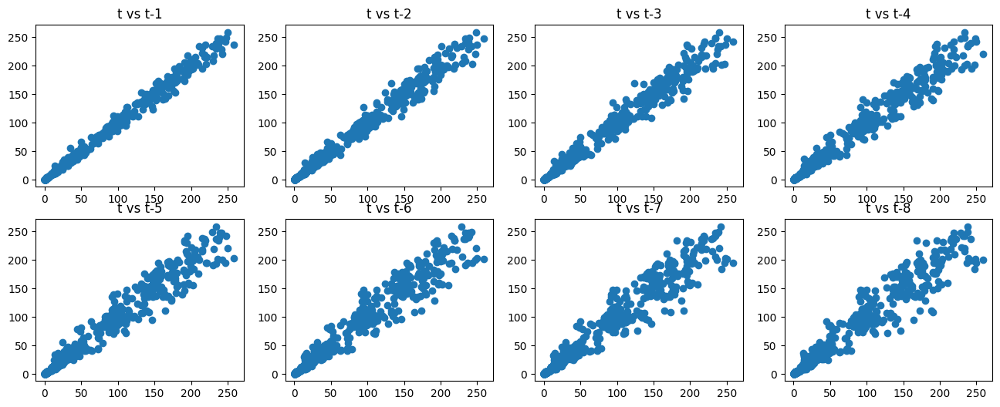

In [48]:
daily_df =df_sol.set_index("Date").groupby(pd.Grouper(freq='D')).Close.mean()
daily_values = pd.DataFrame(daily_df.values)

lags = 8
columns = [daily_values]

for i in range(1,(lags + 1)):
    columns.append(daily_values.shift(i)) # downward shift by i positions

dataframe = pd.concat(columns, axis=1)

col_names = ['t'] + ['t-'+str(l) for l in range(1,(lags + 1))]

dataframe.columns = col_names

plt.figure(figsize=(16,6))

for i in range(1,(lags + 1)):
    ax = plt.subplot(240 + i)
    ax.set_title('t vs t-' + str(i))
    plt.scatter(x=dataframe['t'].values, y=dataframe['t-'+str(i)].values)

plt.show()

Observations: the price at t correlates quite strongly with the price at previous time points (from t-1 to t-8), for lower price values (approximately half of maximum price). Beyond this value, the correlation becomes weaker the more we go back in time.

We know from the first line plot we looked at that solana price surged in 2021. Also, common knowledge of crypto assets market says that prices get very volatile when there is a lot of hype and more people get into the market. So, when prices are high, we expect a lot of volatility (more abrupt and erratic price changes across days). This is what the plots above tell us too.

So, what we conclude: there's a strong positive relationship with prices on previous days, but not so much when the market becomes hyped and volatile.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

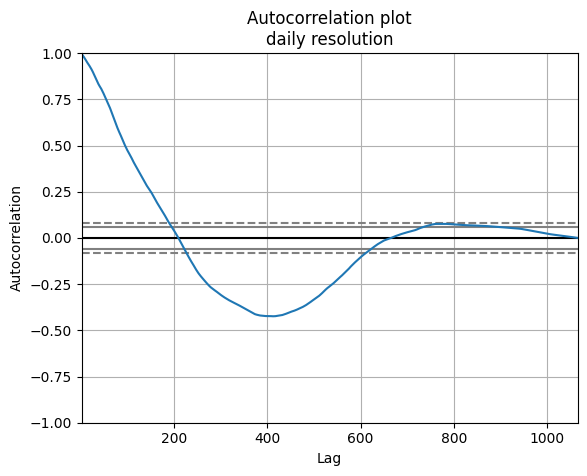

In [49]:
'''
Autocorrelation plots
- To quantify the relationship between the price and the actual lag value
- Where:
 1 (strongest negative correlation)
 0 (no relationshop at all)
 1 (strongest positive correlation)
'''

sol_days_df = df_sol.set_index("Date").groupby(pd.Grouper(freq='D')).Close.mean()

autocorrelation_plot(sol_days_df)

plt.title('Autocorrelation plot\ndaily resolution')
plt.show()

We see a statistically significant correlation with up tp 200-ish previous days average prices. The more we go back in time, the lower the correlation, until it starts to become slightly negative (statistically significant).

We know markets have a global evolution (bull / bear market) and local trends (short term excitement for the price of an asset and then slight corrections).

So, depending on the time resolution our data has, the autocorrelation plot iss excepted to capture the underlying long or short term trend.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

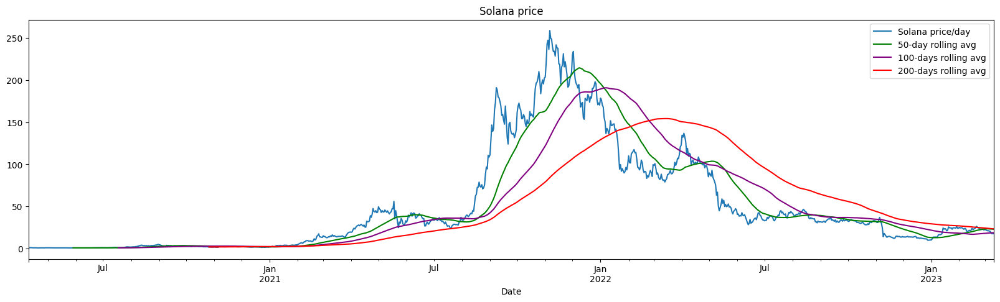

In [52]:
#Linear plot with moving average

#Create the different types of moving average
fifty_days=50
hund_days = 100
twohun_dayz = 200

#df_index_date.Close.plot(figsize=(20,5))
df_sol.set_index("Date").Close.plot(figsize=(20,5))

# tail-rolling average transform
rolling_f = df_sol.set_index("Date").Close.rolling(window=fifty_days)
rolling_f_mean = rolling_f.mean()
rolling_f_mean.plot(color='green')

rolling_m = df_sol.set_index("Date").Close.rolling(window=hund_days)
rolling_m_mean = rolling_m.mean()
rolling_m_mean.plot(color='purple')

rolling_y = df_sol.set_index("Date").Close.rolling(window=twohun_dayz)
rolling_y_mean = rolling_y.mean()
rolling_y_mean.plot(color='red')

plt.legend(['Solana price/day','50-day rolling avg', '100-days rolling avg', '200-days rolling avg'])
plt.title('Solana price')
plt.show()

### Comparing Between ETH & SOL

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

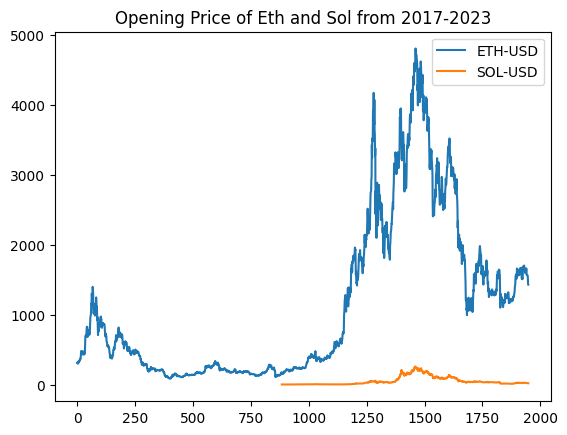

In [53]:
#Opening price of ETH & SOL
datasets.plot.line(y="Open",use_index=True)
plt.title("Opening Price of Eth and Sol from 2017-2023")
plt.show()

From the graphs ,it seems that the price at peak at ETH also marks the peak of SOL at 2022.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

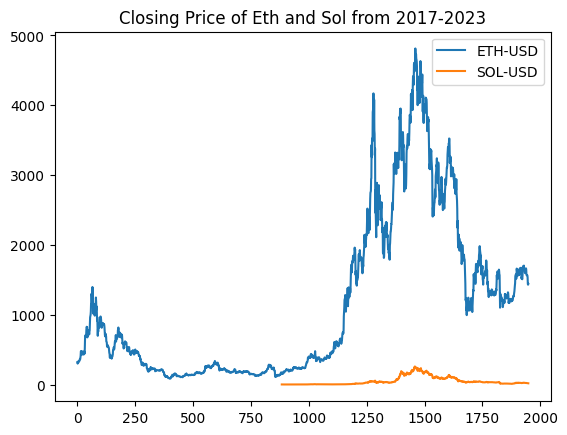

In [54]:
#Closing price of ETH & SOL
datasets.plot.line(y="Close",use_index=True)
plt.title("Closing Price of Eth and Sol from 2017-2023")
plt.show()

It seems that the price at peak at ETH also marks the peak of SOL at 2022.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

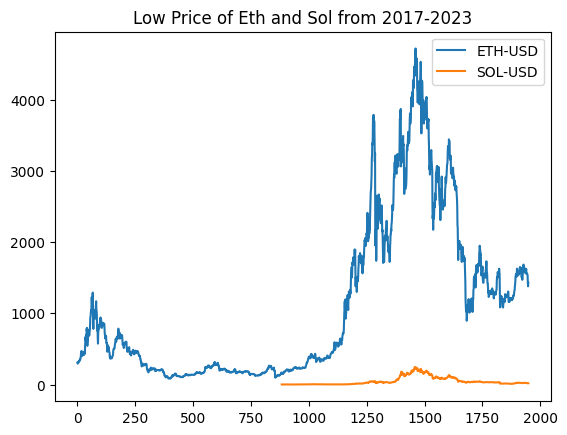

In [55]:
#Low Price of ETH & SOL
datasets.plot.line(y="Low",use_index=True)
plt.title("Low Price of Eth and Sol from 2017-2023")
plt.show()

It seems that the price at peak at ETH also marks the peak of SOL at 2022.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

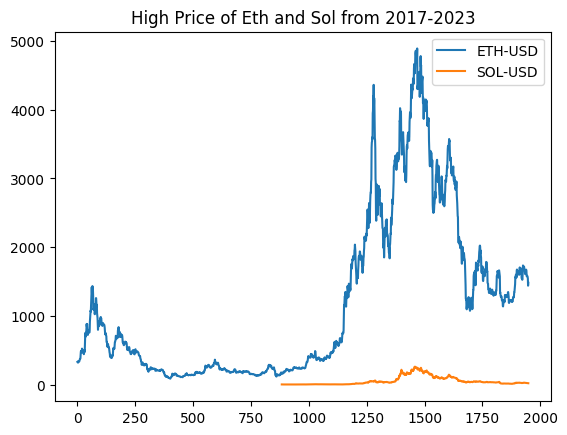

In [56]:
#High Price of ETH & SOL
datasets.plot.line(y="High",use_index=True)
plt.title("High Price of Eth and Sol from 2017-2023")
plt.show()

It seems that the price at peak at ETH also marks the peak of SOL at 2022.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

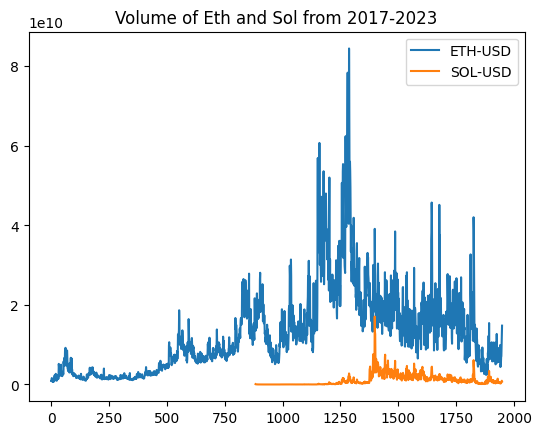

In [57]:
#Volume Price of ETH & SOL
datasets.plot.line(y="Volume",use_index=True)
plt.title("Volume of Eth and Sol from 2017-2023")
plt.show()

The graphs shows that the ETH volume peaks at early 2021 where as sol volume peaks at late 2021.
Besides that, the time where the peak of sol price is at also marks the sol peak volume of 2021.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/var/folders/b2/1_py_fv17p173bxx_hhg8qdc0000gn/T/ipykernel_52280/3546639493.py:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<IPython.core.display.Javascript object>

/var/folders/b2/1_py_fv17p173bxx_hhg8qdc0000gn/T/ipykernel_52280/3546639493.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<IPython.core.display.Javascript object>

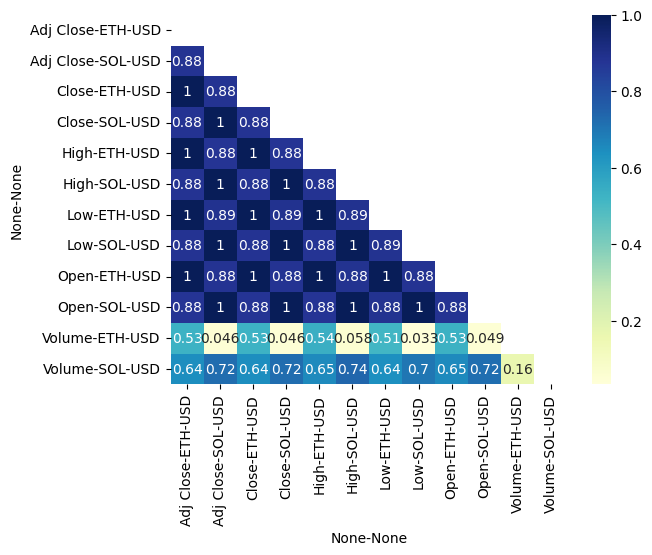

In [58]:
#Triangle Eth and sol correlation Heatmap

#Create mask
eth_sol_mask=np.triu(np.ones_like(datasets.corr()))

#Plot triangle correlation heatmap
df_eth_sol_heatmap=sns.heatmap(datasets.corr(),
                       cmap="YlGnBu",
                      annot=True,
                      mask=eth_sol_mask)

# displaying heatmap
plt.show()

Based on this correlation heatmap, the correlation between Sol and Eth prices is 0.88. This means that it has high correlation. This means that if eth prices goes up, sol prices also goes up. 

Besides this, the volume between eth and sol has a correlation of 0.16. It means that the volume of transations between eth and sol does not have high correlation.

## Model 1 : SARIMA

### ARIMA assumptions
- No Irregularity. Eg. No irregular events like COVID-19 that affect our data
- ARIMA is naive model for non-seasonal data which means that different seasons do not affect its values. When there exists seasonality, use Seasonal ARIMA (SARIMA) model.
- Data should be stationary
- Data should be univariate

In [206]:
#choose the variable for Sarima
df_sarima=df_sol[["Date","Close"]]
#Rename
df_sarima=df_sarima.rename(columns={'Date':'ds', 'Close':'y'})
df_sarima.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [207]:
df_sarima["ds"]=df_sarima["ds"].astype(str) 
df_sarima.dtypes

ds     object
y     float64
dtype: object

In [210]:
df_sarima.reset_index(inplace=True,drop=True)
df_sarima

,ds,y
0,2020-04-10,0.951054
1,2020-04-11,0.776819
2,2020-04-12,0.882507
3,2020-04-13,0.777832
4,2020-04-14,0.661925
...,...,...
1061,2023-03-07,20.244732
1062,2023-03-08,18.421194
1063,2023-03-09,17.308147
1064,2023-03-10,18.243643


In [211]:
# Define the p, d and q parameters to take any value between 0 and 3
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
simple_pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(i[0], i[1], i[2], 12) for i in list(itertools.product(p, d, q))]

print('Parameter combinations for Seasonal ARIMA...')

for param in simple_pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_sarima['y'],
                                            order=param,
                                            )

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

Parameter combinations for Seasonal ARIMA...


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  1.86517D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.865D-09   5.763D+00
  F =   5.7630717278142534     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:12288.868923699989


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0,

 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:10896.980022027252


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10


 This problem is unconstrained.



At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:10896.980022027252


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0,

<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:10896.980022027252


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04


 This problem is unconstrained.



At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:10896.980022027252


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03

At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:10896.980022027252


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.76307D+00    |proj g|=  9.98198D-01

At iterate    5    f=  5.39124D+00    |proj g|=  9.44847D-03


 This problem is unconstrained.



At iterate   10    f=  5.14097D+00    |proj g|=  3.91008D-04

At iterate   15    f=  5.10928D+00    |proj g|=  5.43299D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     28      1     0     0   5.433D-07   5.109D+00
  F =   5.1092776838776981     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:10896.980022027252


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(0, 1, 1, 12)12 - AIC:6237.478193467685


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(1, 1, 0, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92471D+00    |proj g|=  2.07147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.732D-08   2.925D+00
  F =   2.9247083459041674     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(1, 1, 1, 12)12 - AIC:6237.478193467685


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:6237.782722565049


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(0, 0, 1, 12)12 - AIC:6237.782722565049


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(0, 1, 0, 12)12 - AIC:6237.782722565049


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(0, 1, 1, 12)12 - AIC:6237.782722565049


 This problem is unconstrained.


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(1, 0, 0, 12)12 - AIC:6237.782722565049


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(1, 0, 1, 12)12 - AIC:6237.782722565049


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds


 This problem is unconstrained.



At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(1, 1, 0, 12)12 - AIC:6237.782722565049


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  8.29079D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      6      1     0     0   1.514D-07   2.924D+00
  F =   2.9239130968879214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(1, 1, 1, 12)12 - AIC:6237.782722565049


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04



 This problem is unconstrained.


At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(0, 0, 0, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04


 This problem is unconstrained.



At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(0, 0, 1, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04


 This problem is unconstrained.



At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04


 This problem is unconstrained.



At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(0, 1, 1, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04


 This problem is unconstrained.



At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(1, 0, 0, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04


 This problem is unconstrained.



At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(1, 0, 1, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04


 This problem is unconstrained.



At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(1, 1, 0, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92923D+00    |proj g|=  2.08085D-04

At iterate    5    f=  2.92922D+00    |proj g|=  1.18386D-03

At iterate   10    f=  2.92914D+00    |proj g|=  1.03189D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     10     13      1     0     0   1.032D-06   2.929D+00
  F =   2.9291438551988431     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(1, 1, 1, 12)12 - AIC:6248.934699283934


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds


 This problem is unconstrained.



At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04

At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(0, 0, 0, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04

At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F


 This problem is unconstrained.


    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(0, 0, 1, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04



 This problem is unconstrained.


At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(0, 1, 0, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04


 This problem is unconstrained.



At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04

At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(0, 1, 1, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04

At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(1, 0, 0, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04


 This problem is unconstrained.



At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(1, 0, 1, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04

At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(1, 1, 0, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92841D+00    |proj g|=  8.41871D-04

At iterate    5    f=  2.92840D+00    |proj g|=  4.99497D-04

At iterate   10    f=  2.92836D+00    |proj g|=  7.26519D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     17      1     0     0   3.433D-06   2.928D+00
  F =   2.9283186251172886     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


ARIMA(1, 0, 1)x(1, 1, 1, 12)12 - AIC:6249.175308750059


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(0, 0, 0, 12)12 - AIC:6237.788869148551


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(0, 0, 1, 12)12 - AIC:6237.788869148551


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10


 This problem is unconstrained.



At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(0, 1, 0, 12)12 - AIC:6237.788869148551


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(0, 1, 1, 12)12 - AIC:6237.788869148551


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(1, 0, 0, 12)12 - AIC:6237.788869148551


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(1, 0, 1, 12)12 - AIC:6237.788869148551


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(1, 1, 0, 12)12 - AIC:6237.788869148551


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92392D+00    |proj g|=  2.07788D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      2      5      1     0     0   5.947D-06   2.924D+00
  F =   2.9239159799008214     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


ARIMA(1, 1, 0)x(1, 1, 1, 12)12 - AIC:6237.788869148551


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 1, 1)x(0, 0, 0, 12)12 - AIC:6239.778246497846


 This problem is unconstrained.


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


ARIMA(1, 1, 1)x(0, 0, 1, 12)12 - AIC:6239.778246497846


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 1, 1)x(0, 1, 0, 12)12 - AIC:6239.778246497846


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


ARIMA(1, 1, 1)x(0, 1, 1, 12)12 - AIC:6239.778246497846


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 1, 1)x(1, 0, 0, 12)12 - AIC:6239.778246497846


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


ARIMA(1, 1, 1)x(1, 0, 1, 12)12 - AIC:6239.778246497846


<IPython.core.display.Javascript object>

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


ARIMA(1, 1, 1)x(1, 1, 0, 12)12 - AIC:6239.778246497846


<IPython.core.display.Javascript object>

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 1, 1)x(1, 1, 1, 12)12 - AIC:6239.778246497846


In [212]:
# in the “mod = sm.tsa.statespace.SARIMAX” command we need to set up the chosen combination.
#Choose the order and season numbers from the above. We need to choose the low AIC as low is better
sarimax_best_model = SARIMAX(df_sarima["y"], order=(1, 1, 1), seasonal_order=(0, 0, 0, 12)).fit()

print(sarimax_best_model.summary())

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92391D+00    |proj g|=  8.29772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      6      1     0     0   3.593D-05   2.924D+00
  F =   2.9239109974192523     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1066
Model:               SARIMAX(1, 1, 1

 This problem is unconstrained.


<IPython.core.display.Javascript object>

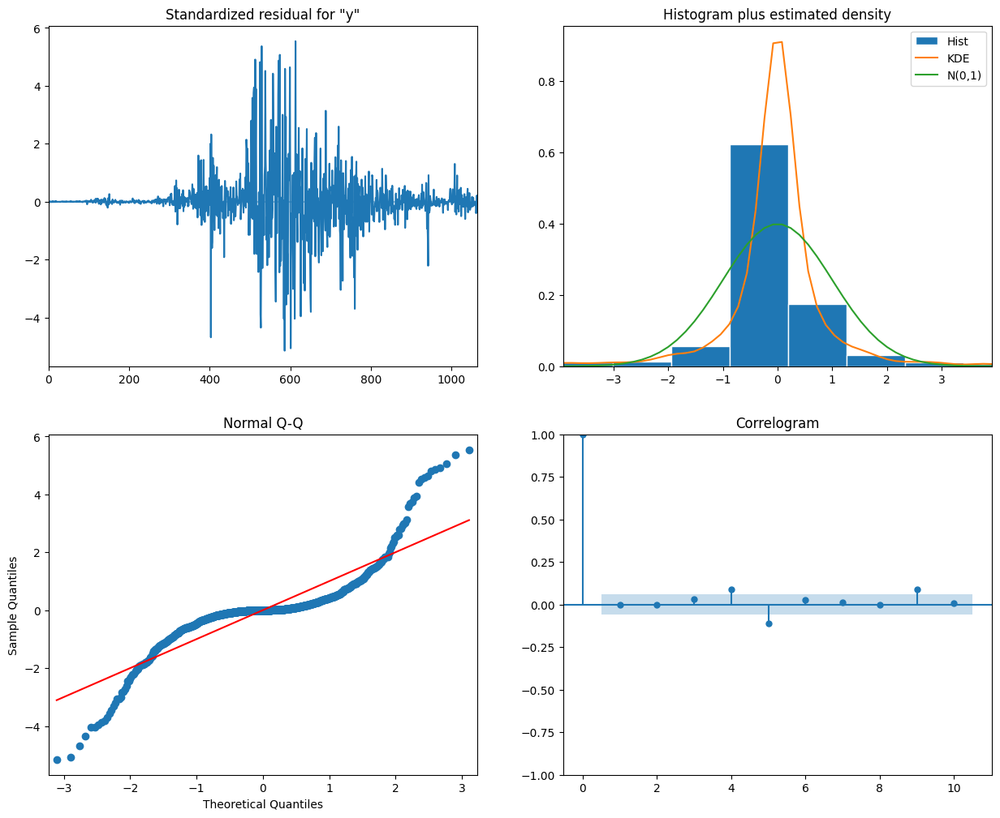

In [213]:
sarimax_best_model.plot_diagnostics(figsize=(15, 12))
plt.show()

### ARIMA Forecast

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

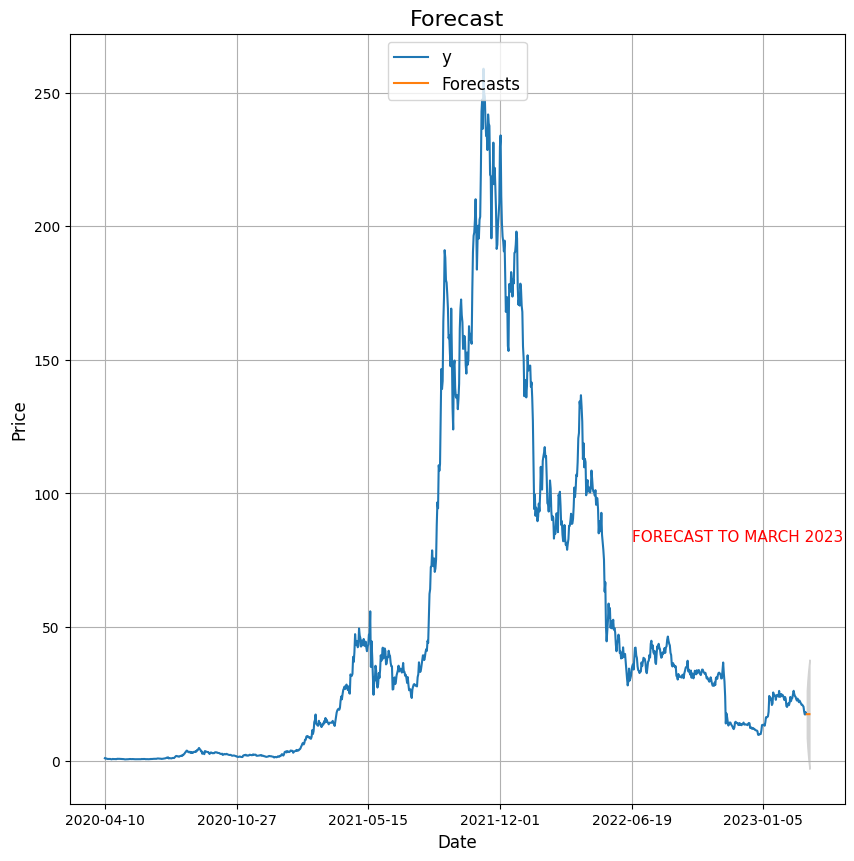

In [226]:
#Forecasting 5 months ahead
#steps is depends on the values that you choose if you choose months, it will be in months, if years, it will be in years
sarimax_forecast_values = sarimax_best_model.get_forecast(steps = 5)

#Confidence intervals of the forecasted values
sarimax_forecast_ci = sarimax_forecast_values.conf_int()

#Plot the data
ax = df_sarima.plot(x="ds" ,y='y', figsize = (10, 10), legend = True)

#Plot the forecasted values 
sarimax_forecast_values.predicted_mean.plot(ax=ax, label='Forecasts', figsize = (10, 10), grid=True)

#Plot the confidence intervals
ax.fill_between(sarimax_forecast_ci.index,
                sarimax_forecast_ci.iloc[: , 0],
                sarimax_forecast_ci.iloc[: , 1], color='#D3D3D3', alpha = 1)
plt.title("Forecast", size=16)
plt.ylabel('Price', size=12)
plt.xlabel('Date', size=12)
plt.legend(loc='upper center', prop={'size': 12})
#annotation
ax.text(800, 82, 'FORECAST TO MARCH 2023', fontsize=11,  color='RED')
plt.show()

In [215]:
#divide into train and validation set to calculate R-squared score and mean absolute percentage error 
train = df_datasets[:int(0.52*(len(df_datasets)))]
test = df_datasets[int(0.52*(len(df_datasets))):]

# establish the earliest month and latest month of the test data set
start=len(train)
end=len(train)+len(test)-1

sarimax_predictions = sarimax_best_model.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMA Predictions')

sarimax_evaluation_results = pd.DataFrame({'r2_score': r2_score(test['Close'], sarimax_predictions)}, index=[0])
sarimax_evaluation_results['mean_absolute_error'] = mean_absolute_error(test['Close'], sarimax_predictions)
sarimax_evaluation_results['root_mean_squared_error'] = np.sqrt(mean_squared_error(test['Close'], sarimax_predictions))
sarimax_evaluation_results['mean_absolute_percentage_error'] = np.mean(np.abs((test['Close'] - sarimax_predictions)/test['Close']))*100
sarimax_evaluation_results

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,r2_score,mean_absolute_error,root_mean_squared_error,mean_absolute_percentage_error
0,-0.804735,1215.329302,1819.386537,79.034721


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

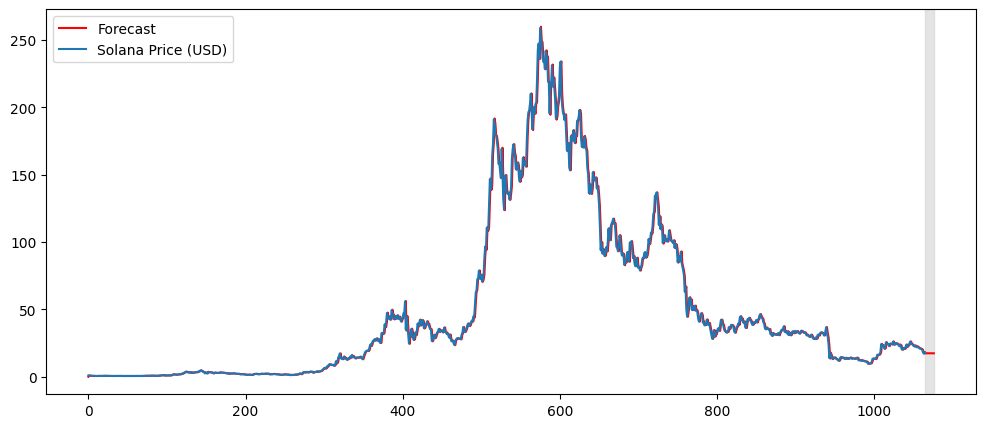

In [218]:
df_sarima['sarima_model'] = sarimax_best_model.fittedvalues

# forecast for entire data set = actual values in data set + future forecasted values
sarimax_forecast = sarimax_best_model.predict(start=df_sarima.shape[0], end=df_sarima.shape[0] + 10)
sarimax_forecast = df_sarima['sarima_model'].append(sarimax_forecast)

plt.figure(figsize=(12, 5))
plt.plot(sarimax_forecast, color='r', label='Forecast',)
plt.axvspan(df_sarima.index[-1], sarimax_forecast.index[-1], alpha=0.6, color='lightgrey')
plt.plot(df_sarima['y'], label='Solana Price (USD)')

plt.legend()
plt.show()

### Model 2 : Prophet

In [86]:
#choose the variable for Sarima
df_prophet=df_sol[["Date","Close"]]

#Rename
df_prophet=df_prophet.rename(columns={'Date':'ds', 'Close':'y'})

#Check format of data
display(df_prophet.dtypes)
display(df_prophet.index)

ds    datetime64[ns]
y            float64
dtype: object

Int64Index([ 884,  886,  888,  890,  892,  894,  896,  898,  900,  902,
            ...
            2996, 2998, 3000, 3002, 3004, 3006, 3008, 3010, 3012, 3014],
           dtype='int64', length=1066)

In [87]:
prophet_model = Prophet(weekly_seasonality=True, daily_seasonality=True,)
prophet_model.fit(df_prophet)

#check weekly seasonality
print(prophet_model.weekly_seasonality)

#check daily seasonality
print(prophet_model.daily_seasonality)

Initial log joint probability = -41.6048
True
True
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2041.5     0.0736962       3088.25           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2199.39    0.00546713       769.476      0.2211      0.2211      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2268.38     0.0358314       625.569      0.5802      0.5802      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2291.85    0.00196862       116.525           1           1      498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     468       2311.98   9.54516e-05       151.147   1.002e-06       0.001      621  LS failed, Hessian reset 
     499       2314.53    0.00

In [88]:
prophet_future = prophet_model.make_future_dataframe(periods=5, freq = 'd')
prophet_future.tail()

,ds
1066,2023-03-12
1067,2023-03-13
1068,2023-03-14
1069,2023-03-15
1070,2023-03-16


#### Building Prophet model

In [89]:
prophet_forecast = prophet_model.predict(prophet_future)

In [90]:
prophet_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1066,2023-03-12,17.781395,4.411420,32.781293
1067,2023-03-13,17.984693,4.348386,31.517208
1068,2023-03-14,18.583391,5.296611,32.451990
1069,2023-03-15,19.858040,6.262597,33.381846
1070,2023-03-16,20.665667,6.350987,33.965996


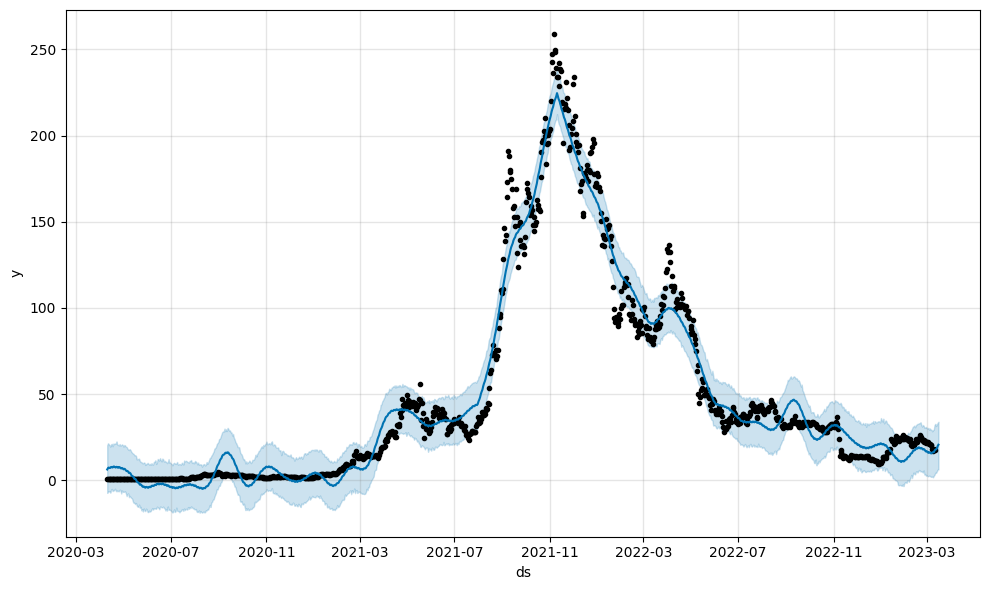

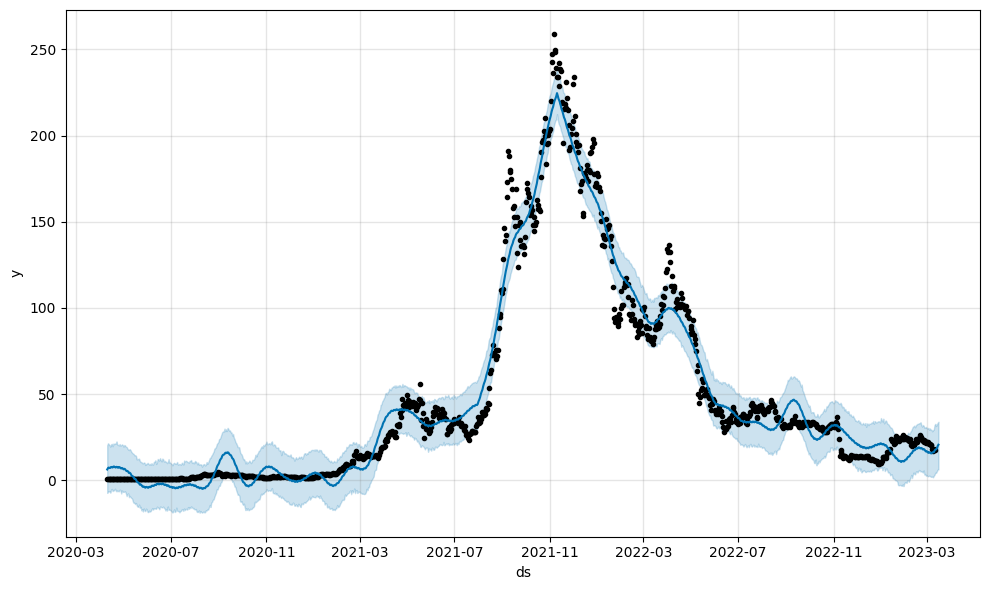

In [92]:
prophet_model.plot(prophet_forecast)

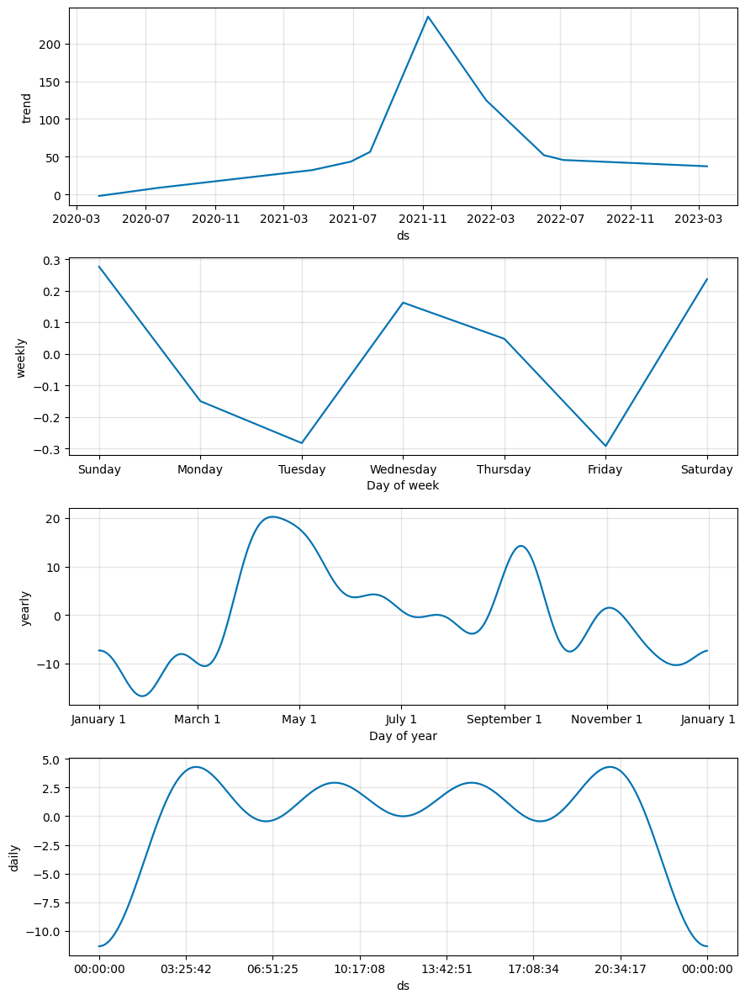

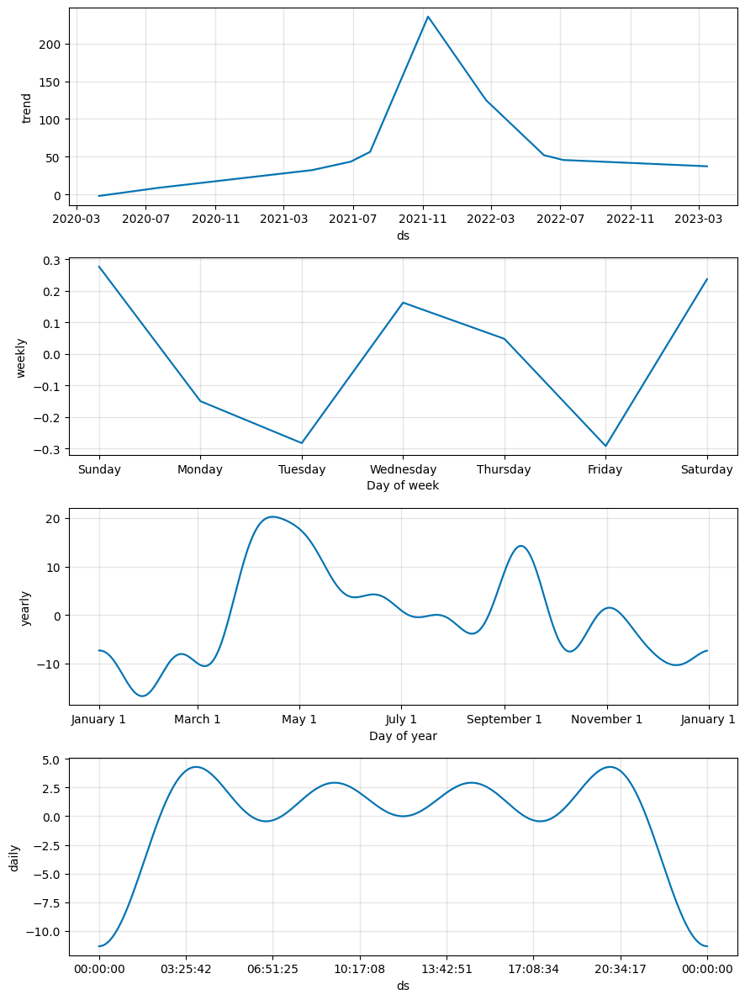

In [93]:
# decompose time series model into trend and seasonality
display(prophet_model.plot_components(prophet_forecast))

In [94]:
# add forecasted data to existing data set / data frame
metric_prophet = prophet_forecast.set_index('ds')[['yhat']].join(df_prophet.set_index('ds').y).reset_index()

In [95]:
#quick check on the future dates where the actual values are not available
print("Before dropping : ")
display(metric_prophet.tail())

#drop the rows of future dates where the actual values are not available
metric_prophet.dropna(inplace=True)

#quick check on the future dates where the actual values are not available
print("After dropping")
display(metric_prophet.tail())

Before dropping : 


,ds,yhat,y
1066,2023-03-12,17.781395,NaN
1067,2023-03-13,17.984693,NaN
1068,2023-03-14,18.583391,NaN
1069,2023-03-15,19.858040,NaN
1070,2023-03-16,20.665667,NaN


After dropping


,ds,yhat,y
1061,2023-03-07,15.624190,20.244732
1062,2023-03-08,16.190101,18.421194
1063,2023-03-09,16.291681,17.308147
1064,2023-03-10,16.268590,18.243643
1065,2023-03-11,17.217073,17.467947


In [96]:
#https://medium.com/@ottaviocalzone/mae-mse-rmse-and-f1-score-in-time-series-forecasting-d04021ffa7ce
rsquared = r2_score(metric_prophet.y, metric_prophet.yhat)
display('R-Squared: %.3f' % rsquared)

mse= mean_squared_error(metric_prophet.y, metric_prophet.yhat)
print('MSE: %.3f' % mse)

rmse = mean_squared_error(metric_prophet.y, metric_prophet.yhat, squared=False)
print('RMSE: %.3f' % rmse)

mae = mean_absolute_error(metric_prophet.y, metric_prophet.yhat)
print('MAE: %.3f' % mae)

mape = np.mean(np.abs((metric_prophet.y - metric_prophet.yhat)/metric_prophet.y))*100
print('MAPE: %.3f' % mape)

'R-Squared: 0.967'

MSE: 114.751
RMSE: 10.712
MAE: 7.949


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

MAPE: 111.193


## Model 3 : LSTM (Pytouch)

In [113]:
df_sol_index_date=df_sol.set_index("Date")
df_sol_index_date=df_sol_index_date[['Close','High','Low','Open','Volume']]
df_sol_index_date

,Close,High,Low,Open,Volume
Date,,,,,
2020-04-10,0.951054,1.313487,0.694187,0.832005,87364276.0
2020-04-11,0.776819,1.049073,0.765020,0.951054,43862444.0
2020-04-12,0.882507,0.956670,0.762426,0.785448,38736897.0
2020-04-13,0.777832,0.891603,0.773976,0.890760,18211285.0
2020-04-14,0.661925,0.796472,0.628169,0.777832,16747614.0
...,...,...,...,...,...
2023-03-07,20.244732,20.886848,19.820597,20.634691,394901279.0
2023-03-08,18.421194,20.332367,18.286304,20.243931,620543521.0
2023-03-09,17.308147,18.689047,16.943132,18.424707,754162560.0


In [114]:
#test new dataset
X, y = df_sol_index_date.drop(columns=['Close']), df_sol_index_date.Close.values
X.shape, y.shape

((1066, 4), (1066,))

In [111]:
# split a multivariate sequence past, future samples (X and y)
def split_sequences(input_sequences, output_sequence, n_steps_in, n_steps_out):
    X, y = list(), list() # instantiate X and y
    for i in range(len(input_sequences)):
        # find the end of the input, output sequence
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out - 1
        # check if we are beyond the dataset
        if out_end_ix > len(input_sequences): break
        # gather input and output of the pattern
        seq_x, seq_y = input_sequences[i:end_ix], output_sequence[end_ix-1:out_end_ix, -1]
        X.append(seq_x), y.append(seq_y)
    return np.array(X), np.array(y)

In [115]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
mm = MinMaxScaler()
ss = StandardScaler()

X_trans = ss.fit_transform(X)
y_trans = mm.fit_transform(y.reshape(-1, 1))
#https://stackoverflow.com/questions/18691084/what-does-1-mean-in-numpy-reshape

In [116]:
X_ss, y_mm = split_sequences(X_trans, y_trans, 100, 50)
print(X_ss.shape, y_mm.shape)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

(918, 100, 4) (918, 50)


In [117]:
assert y_mm[0].all() == y_trans[99:149].squeeze(1).all()
y_mm[0]

array([0.00174643, 0.00156752, 0.00138463, 0.00178738, 0.00204634,
       0.00206862, 0.00185773, 0.00285176, 0.00406254, 0.00488882,
       0.00490983, 0.00442311, 0.00453347, 0.00395832, 0.00391355,
       0.00475018, 0.00498159, 0.00524871, 0.00479561, 0.00654393,
       0.00607784, 0.0075782 , 0.00831965, 0.0101251 , 0.01078924,
       0.0125938 , 0.01254048, 0.01119931, 0.01032634, 0.01110746,
       0.00999669, 0.01089201, 0.00922443, 0.01042104, 0.00939712,
       0.00969593, 0.01086281, 0.01095009, 0.01063999, 0.01177584,
       0.01133735, 0.01352888, 0.01336409, 0.01517129, 0.01651106,
       0.01481796, 0.01412125, 0.01165575, 0.01172716, 0.00805917])

In [118]:
total_samples = len(X)
train_test_cutoff = round(0.70 * total_samples)

X_train = X_ss[:-150]
X_test = X_ss[-150:]

y_train = y_mm[:-150]
y_test = y_mm[-150:] 

print("Training Shape:", X_train.shape, y_train.shape)
print("Testing Shape:", X_test.shape, y_test.shape) 

Training Shape: (768, 100, 4) (768, 50)
Testing Shape: (150, 100, 4) (150, 50)


In [119]:
seq_model = nn.Sequential(
    nn.Linear(1, 13),
    nn.Tanh(),
    nn.Linear(13, 1))
seq_model

Sequential(
  (0): Linear(in_features=1, out_features=13, bias=True)
  (1): Tanh()
  (2): Linear(in_features=13, out_features=1, bias=True)
)

In [120]:
# convert to pytorch tensors
X_train_tensors = Variable(torch.Tensor(X_train))
X_test_tensors = Variable(torch.Tensor(X_test))

y_train_tensors = Variable(torch.Tensor(y_train))
y_test_tensors = Variable(torch.Tensor(y_test))

In [121]:
# reshaping to rows, timestamps, features
X_train_tensors_final = torch.reshape(X_train_tensors,   
                                      (X_train_tensors.shape[0], 100, 
                                       X_train_tensors.shape[2]))
X_test_tensors_final = torch.reshape(X_test_tensors,  
                                     (X_test_tensors.shape[0], 100, 
                                      X_test_tensors.shape[2])) 

print("Training Shape:", X_train_tensors_final.shape, y_train_tensors.shape)
print("Testing Shape:", X_test_tensors_final.shape, y_test_tensors.shape) 

Training Shape: torch.Size([768, 100, 4]) torch.Size([768, 50])
Testing Shape: torch.Size([150, 100, 4]) torch.Size([150, 50])


In [122]:
X_check, y_check = split_sequences(X, y.reshape(-1, 1), 100, 50)
X_check[-1][0:4]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

array([[3.19096565e+01, 2.97599316e+01, 3.05424881e+01, 8.36283411e+08],
       [3.01512547e+01, 2.95340061e+01, 3.00061321e+01, 5.47825492e+08],
       [3.04447289e+01, 2.95788422e+01, 2.95788422e+01, 6.08389719e+08],
       [3.12639923e+01, 2.98831596e+01, 3.01680908e+01, 6.58840500e+08]])

In [123]:
y_check[-1]

array([24.62783813, 24.23278999, 24.35780716, 22.79567337, 24.57144547,
       24.35069656, 24.40785789, 23.98180199, 26.13238716, 23.94632149,
       23.95254707, 24.99335861, 24.26505852, 24.68089676, 24.31774521,
       23.49343872, 22.70638847, 23.86135674, 23.19267082, 20.45212746,
       20.13010979, 20.83009529, 21.48997879, 20.7901001 , 21.82495308,
       23.8839016 , 22.28595161, 23.16675758, 23.47859192, 24.84075165,
       26.18138695, 24.94855881, 24.1813488 , 23.9008007 , 23.05303574,
       22.52339935, 23.25608826, 22.69258881, 21.91638756, 22.50643158,
       21.98487854, 21.39935303, 20.96683884, 20.97858429, 20.63501167,
       20.2447319 , 18.42119408, 17.30814743, 18.24364281, 17.46794701])

In [125]:
df_sol_index_date.Close.values[-50:]

array([24.62783813, 24.23278999, 24.35780716, 22.79567337, 24.57144547,
       24.35069656, 24.40785789, 23.98180199, 26.13238716, 23.94632149,
       23.95254707, 24.99335861, 24.26505852, 24.68089676, 24.31774521,
       23.49343872, 22.70638847, 23.86135674, 23.19267082, 20.45212746,
       20.13010979, 20.83009529, 21.48997879, 20.7901001 , 21.82495308,
       23.8839016 , 22.28595161, 23.16675758, 23.47859192, 24.84075165,
       26.18138695, 24.94855881, 24.1813488 , 23.9008007 , 23.05303574,
       22.52339935, 23.25608826, 22.69258881, 21.91638756, 22.50643158,
       21.98487854, 21.39935303, 20.96683884, 20.97858429, 20.63501167,
       20.2447319 , 18.42119408, 17.30814743, 18.24364281, 17.46794701])

In [126]:
X.iloc[-149:-145]

,High,Low,Open,Volume
Date,,,,
2022-10-14,31.909657,29.759932,30.542488,836283411.0
2022-10-15,30.151255,29.534006,30.006132,547825492.0
2022-10-16,30.444729,29.578842,29.578842,608389719.0
2022-10-17,31.263992,29.883160,30.168091,658840500.0


In [127]:
class LSTM(nn.Module):
    
    def __init__(self, num_classes, input_size, hidden_size, num_layers):
        super().__init__()
        self.num_classes = num_classes # output size
        self.num_layers = num_layers # number of recurrent layers in the lstm
        self.input_size = input_size # input size
        self.hidden_size = hidden_size # neurons in each lstm layer
        # LSTM model
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True, dropout=0.2) # lstm
        self.fc_1 =  nn.Linear(hidden_size, 128) # fully connected 
        self.fc_2 = nn.Linear(128, num_classes) # fully connected last layer
        self.relu = nn.ReLU()
        
    def forward(self,x):
        # hidden state
        h_0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        # cell state
        c_0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        # propagate input through LSTM
        output, (hn, cn) = self.lstm(x, (h_0, c_0)) # (input, hidden, and internal state)
        hn = hn.view(-1, self.hidden_size) # reshaping the data for Dense layer next
        out = self.relu(hn)
        out = self.fc_1(out) # first dense
        out = self.relu(out) # relu
        out = self.fc_2(out) # final output
        return out

In [128]:
def training_loop(n_epochs, lstm, optimiser, loss_fn, X_train, y_train,
                  X_test, y_test):
    for epoch in range(n_epochs):
        lstm.train()
        outputs = lstm.forward(X_train) # forward pass
        optimiser.zero_grad() # calculate the gradient, manually setting to 0
        # obtain the loss function
        loss = loss_fn(outputs, y_train)
        loss.backward() # calculates the loss of the loss function
        optimiser.step() # improve from loss, i.e backprop
        # test loss
        lstm.eval()
        test_preds = lstm(X_test)
        test_loss = loss_fn(test_preds, y_test)
        
        if epoch % 1000 == 0:
            print("Epoch: %d, train loss: %1.5f, test loss: %1.5f, accuracy score :%1.5f " % (epoch, 
                                                                      loss.item(), 
                                                                      test_loss.item())) 


In [129]:
def training_loop(n_epochs, lstm, optimiser, loss_fn, X_train, y_train,X_test, y_test):
    for epoch in range(n_epochs):
        lstm.train()
        outputs = lstm.forward(X_train) # forward pass
        optimiser.zero_grad() # calculate the gradient, manually setting to 0
        # obtain the loss function
        loss = loss_fn(outputs, y_train)
        loss.backward() # calculates the loss of the loss function
        optimiser.step() # improve from loss, i.e backprop
        # test loss
        lstm.eval()
        test_preds = lstm(X_test)
        test_loss = loss_fn(test_preds, y_test)
        
        if epoch % 1000 == 0:
            print("Epoch: %d, train loss: %1.5f, test loss: %1.5f " % (epoch, 
                                                                      loss.item(), 
                                                                      test_loss.item())) 

In [136]:
n_epochs = 5000 # 10000 epochs
learning_rate = 0.001 # 0.001 lr

input_size = 4 # number of features
hidden_size = 2 # number of features in hidden state
num_layers = 1 # number of stacked lstm layers

num_classes = 50 # number of output classes 

lstm = LSTM(num_classes, 
              input_size, 
              hidden_size, 
              num_layers)

In [137]:
loss_fn = torch.nn.MSELoss()
optimiser = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

In [138]:
%%time
training_loop(n_epochs=n_epochs,
              lstm=lstm,
              optimiser=optimiser,
              loss_fn=loss_fn,
              X_train=X_train_tensors_final,
              y_train=y_train_tensors,
              X_test=X_test_tensors_final,
              y_test=y_test_tensors)

Epoch: 0, train loss: 0.15711, test loss: 0.03553 
Epoch: 1000, train loss: 0.00851, test loss: 0.00759 
Epoch: 2000, train loss: 0.00478, test loss: 0.03240 
Epoch: 3000, train loss: 0.00425, test loss: 0.03949 
Epoch: 4000, train loss: 0.00383, test loss: 0.01945 
CPU times: user 2min 34s, sys: 7.38 s, total: 2min 41s
Wall time: 2min 34s


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

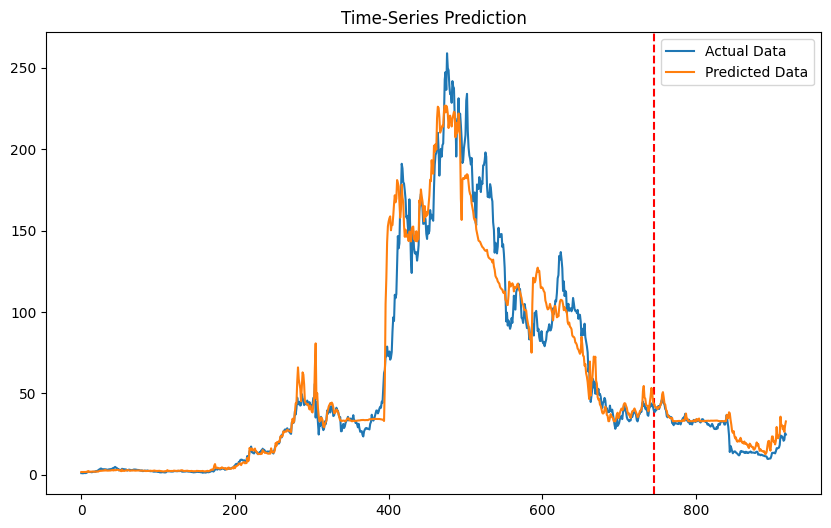

In [144]:
df_X_ss = ss.transform(df_sol_index_date.drop(columns=['Close'])) # old transformers
df_y_mm = mm.transform(df_sol_index_date.Close.values.reshape(-1, 1)) # old transformers


# split the sequence
df_X_ss, df_y_mm = split_sequences(df_X_ss, df_y_mm, 100, 50)
# converting to tensors
df_X_ss = Variable(torch.Tensor(df_X_ss))
df_y_mm = Variable(torch.Tensor(df_y_mm))
# reshaping the dataset
df_X_ss = torch.reshape(df_X_ss, (df_X_ss.shape[0], 100, df_X_ss.shape[2]))

train_predict = lstm(df_X_ss) # forward pass
data_predict = train_predict.data.numpy() # numpy conversion
dataY_plot = df_y_mm.data.numpy()

data_predict = mm.inverse_transform(data_predict) # reverse transformation
dataY_plot = mm.inverse_transform(dataY_plot)
true, preds = [], []
for i in range(len(dataY_plot)):
    true.append(dataY_plot[i][0])
for i in range(len(data_predict)):
    preds.append(data_predict[i][0])
plt.figure(figsize=(10,6)) #plotting
plt.axvline(x=train_test_cutoff, c='r', linestyle='--') # size of the training set

plt.plot(true, label='Actual Data') # actual plot
plt.plot(preds, label='Predicted Data') # predicted plot
plt.title('Time-Series Prediction')
plt.legend()
plt.savefig(f"../02-Saved_EDA/Model3-LSTM_plot-{currentDate}.png", dpi=300)
plt.show() 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

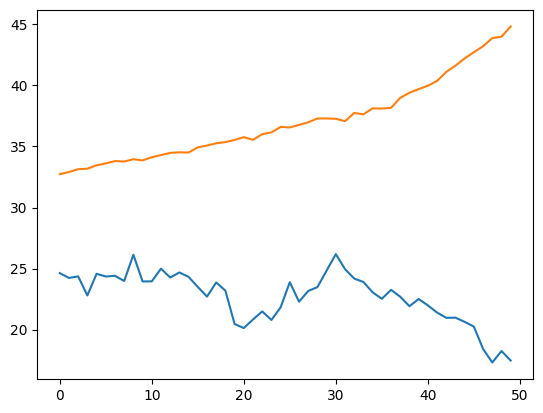

In [145]:
test_predict = lstm(X_test_tensors_final[-1].unsqueeze(0)) # get the last sample
test_predict = test_predict.detach().numpy()
test_predict = mm.inverse_transform(test_predict)
test_predict = test_predict[0].tolist()

test_target = y_test_tensors[-1].detach().numpy() # last sample again
test_target = mm.inverse_transform(test_target.reshape(1, -1))
test_target = test_target[0].tolist()

plt.plot(test_target, label="Actual Data")
plt.plot(test_predict, label="LSTM Predictions")
plt.savefig(f"../02-Saved_EDA/Model3-LSTM_small_plot-{currentDate}.png", dpi=300)
plt.show();

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

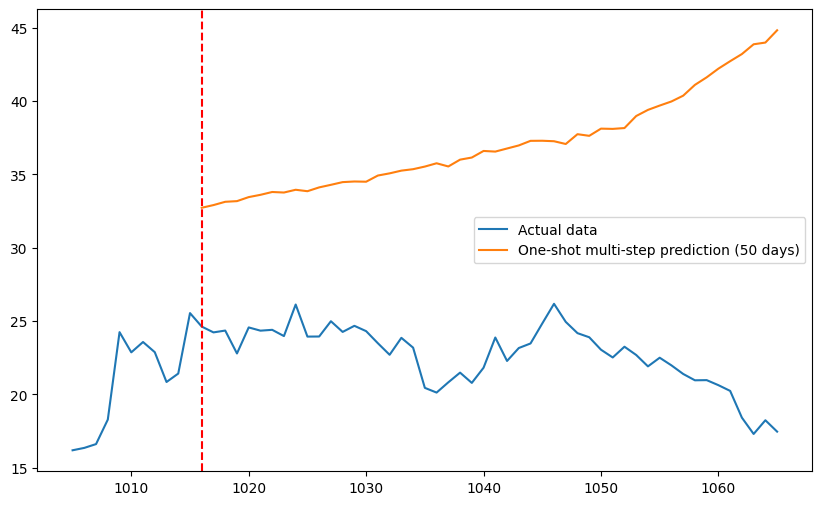

In [146]:
plt.figure(figsize=(10,6)) #plotting
a = [x for x in range(1005, len(y))]
plt.plot(a, y[1005:], label='Actual data');
c = [x for x in range(len(y)-50, len(y))]
plt.plot(c, test_predict, label='One-shot multi-step prediction (50 days)')
plt.axvline(x=len(y)-50, c='r', linestyle='--')
plt.legend()
plt.show()